In [1]:
%matplotlib widget

In [2]:
%pwd

'C:\\Users\\g_gos\\Code\\TimeSeriesInsightToolkit'

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import math

from scipy import stats
from scipy.spatial.distance import euclidean
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import homogeneity_score
from sklearn.cluster import AgglomerativeClustering

import json
import timeSeriesInsightToolkit as tsi
from math import ceil

# Position

In [7]:
basePath = "path/to/group/folder/" 
pathSes  = basePath + "preprocessed-VR-sessions-gated/" 

ids, fileNames, dfSs, df = tsi.readData(pathSes)
ids, fileNames, [paths,dpaths,fpaths] = tsi.getVarsFromSession(pathSes,['pos','dir','f'])
#print(fpaths[0].shape, paths[1].shape)
bbox = tsi.makeBBox(paths,dpaths,fpaths)
print(bbox)

# for panoramic scene data we only look at directions
paths = [tsi.getPath(dfSs[uId],['dirx','diry','dirz']) for uId in ids]

{'x0': -6.505999999999999, 'x1': 5.856, 'y0': -0.04500000000000004, 'y1': 5.01, 'z0': -6.006, 'z1': 5.936}


C:\Users\g_gos\AppData\Local\Temp\ipykernel_19420\1240856247.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(9,3))


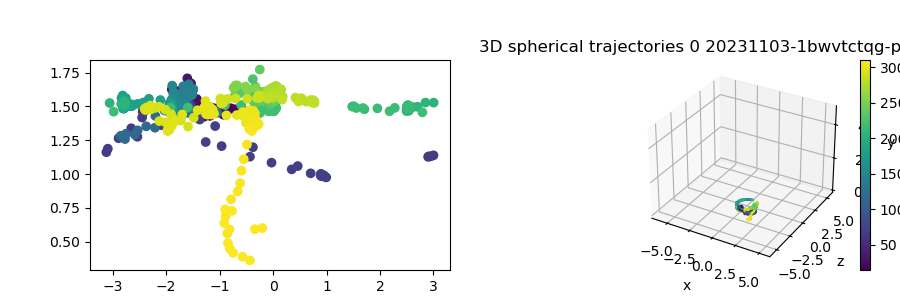

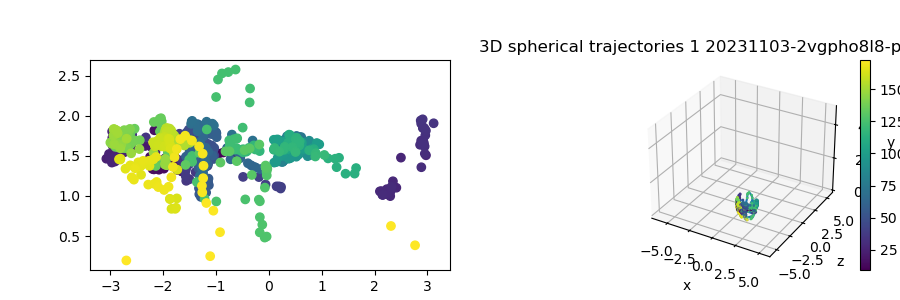

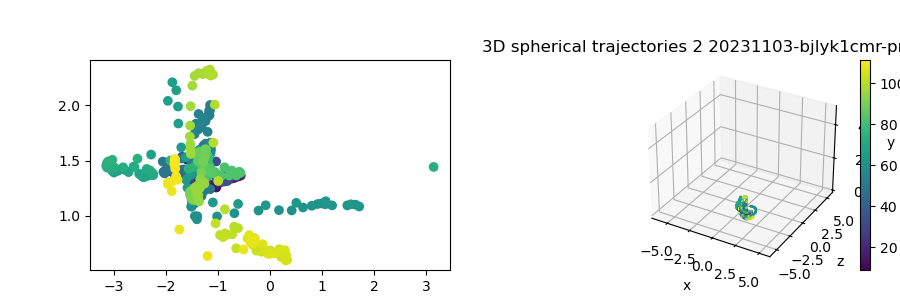

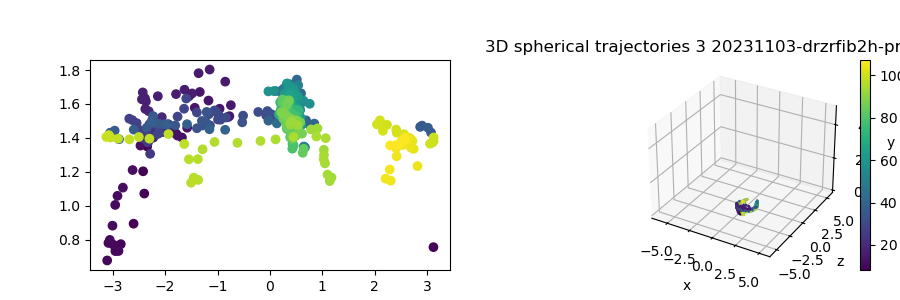

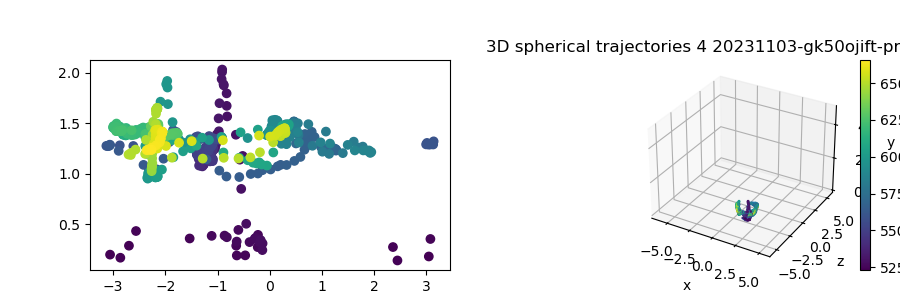

...

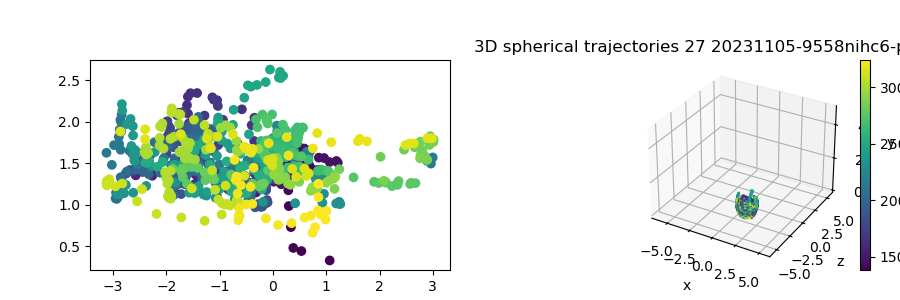

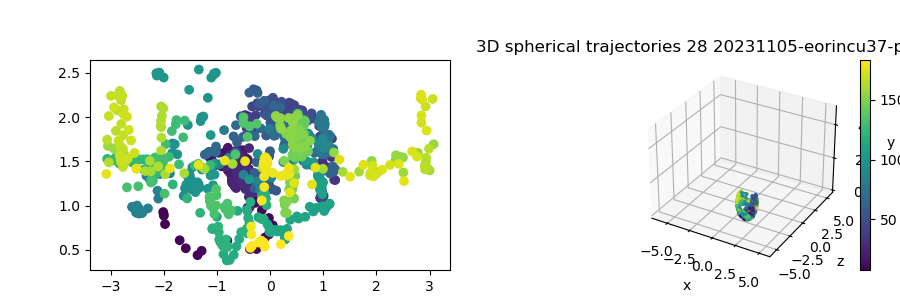

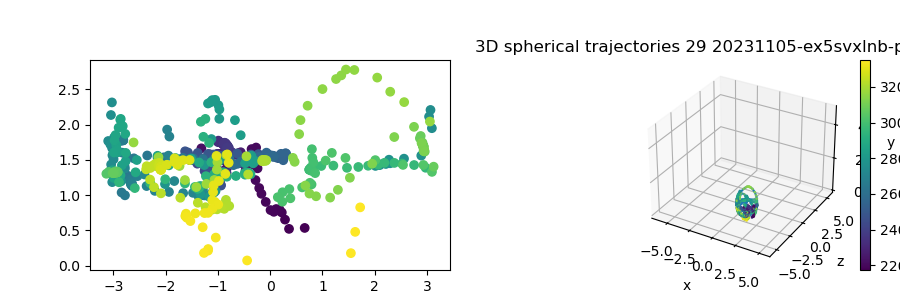

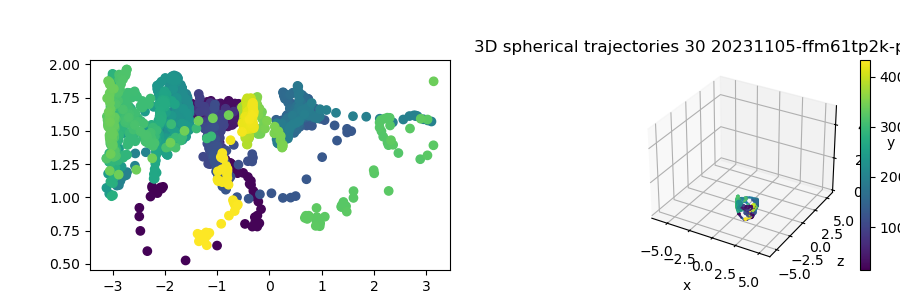

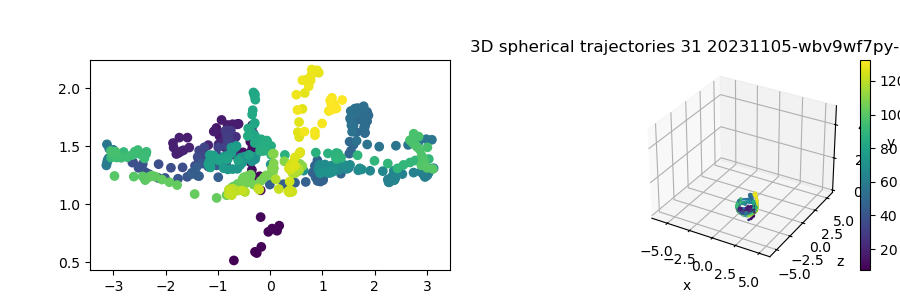

In [9]:
for uId in ids:
    path = paths[uId] #ts[uId],xs[uId],ys[uId],zs[uId]
    #dpath = dpaths[uId]
    fig = plt.figure(figsize=(9,3))
    ax = fig.add_subplot([0.7, 0.1, 0.3, 0.7] , projection='3d') 
    ax,sc = tsi.drawPath(path, dpath=None, ax=ax, BBox=bbox, colorbar=True)
    ax.set_title('3D spherical trajectories '+str(uId)+' '+fileNames[uId])
    #plt.stop()
    ax1 = fig.add_subplot([0.1, 0.1, 0.4, 0.7]) 
    t,x,y,z = path.T
    theta,phi = tsi.cartesian_to_spherical(x,z,y)
    ax1.scatter(phi,theta,c=t)
    

file name 0 20231103-1bwvtctqg-preprocessed
file name 1 20231103-2vgpho8l8-preprocessed
file name 2 20231103-bjlyk1cmr-preprocessed
file name 3 20231103-drzrfib2h-preprocessed
file name 4 20231103-gk50ojift-preprocessed
file name 5 20231103-iw85c2wkj-preprocessed
file name 6 20231103-rno9vvvqx-preprocessed
file name 7 20231103-rrwvhqrig-preprocessed
file name 8 20231103-t87zsmuf9-preprocessed
file name 9 20231103-vtfvcgjrq-preprocessed
file name 10 20231103-xe2ldwgh8-preprocessed
file name 11 20231104-53mdn1h2c-preprocessed
file name 12 20231104-8el9spbea-preprocessed
file name 13 20231104-bvtcdg8hg-preprocessed
file name 14 20231104-fx8jtjkl9-preprocessed
file name 15 20231104-ir1r2tmcd-preprocessed
file name 16 20231104-j3litcurd-preprocessed
file name 17 20231104-jo1usyvoz-preprocessed
file name 18 20231104-k9koylu3r-preprocessed
file name 19 20231104-ombg08rdr-preprocessed
file name 20 20231104-pvvamuidp-preprocessed
file name 21 20231104-rgi8v0e4s-preprocessed
file name 22 2023110

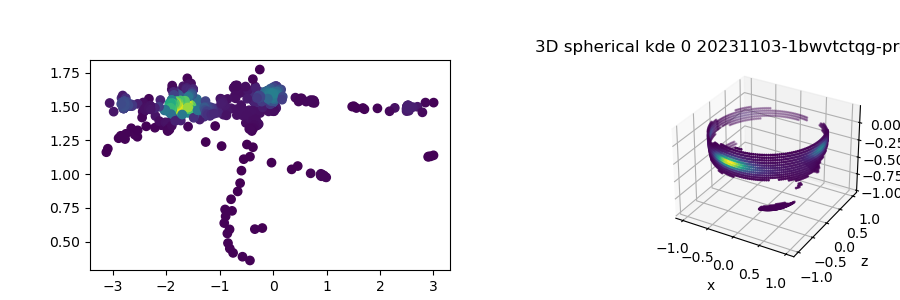

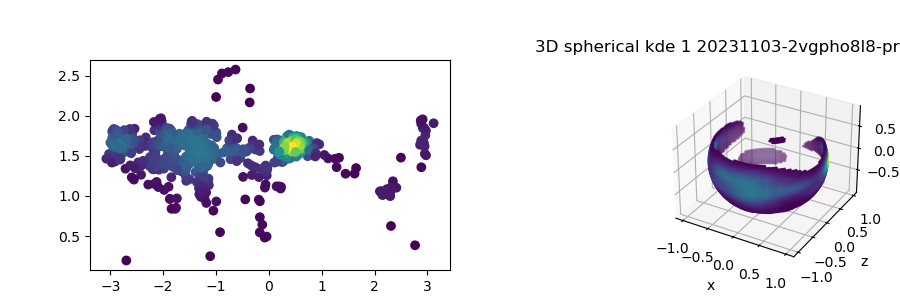

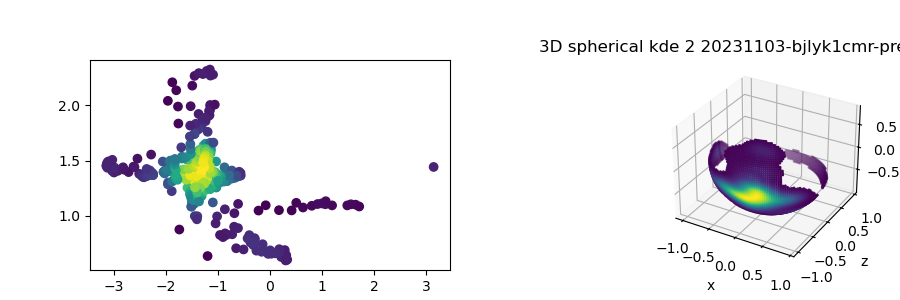

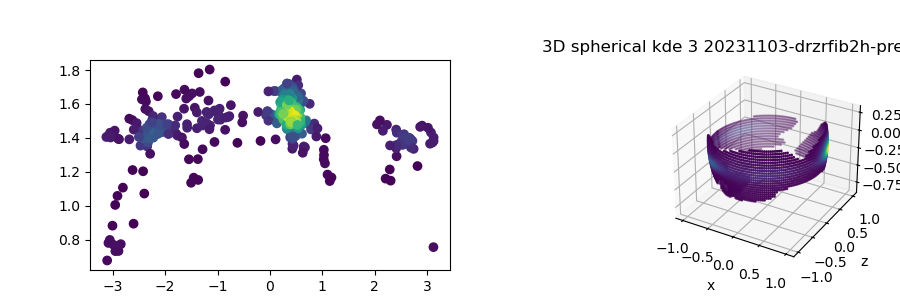

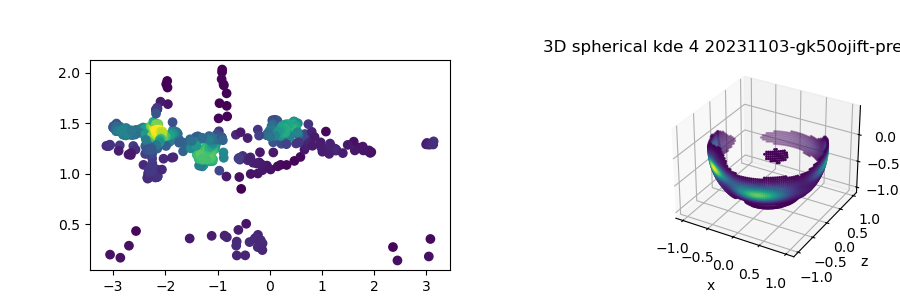

...

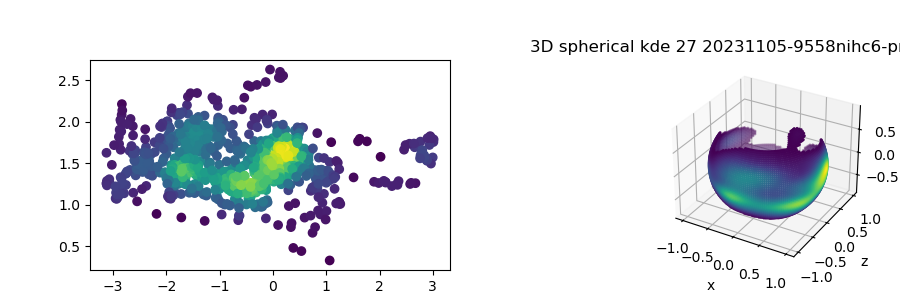

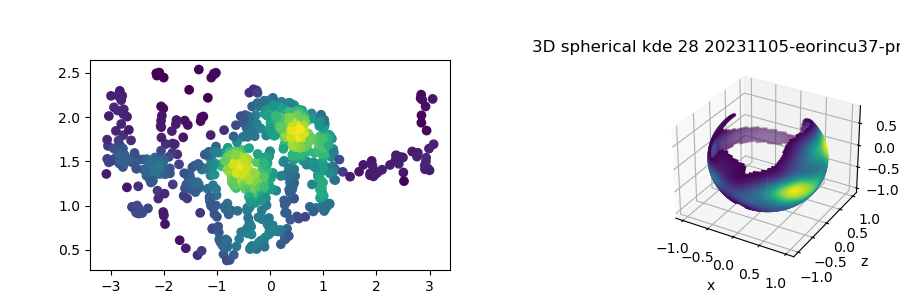

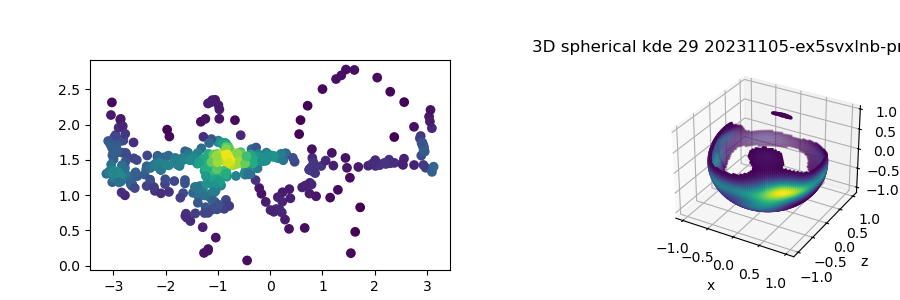

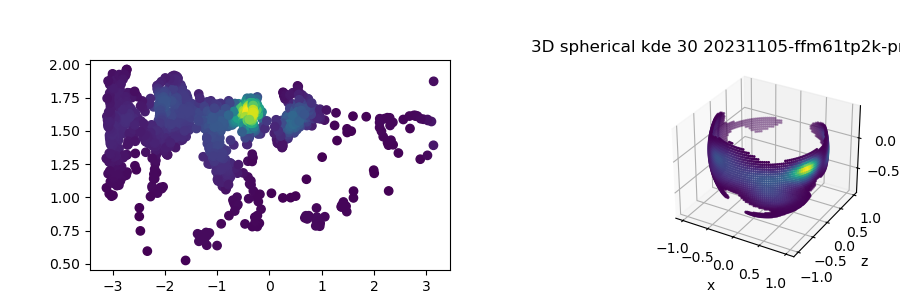

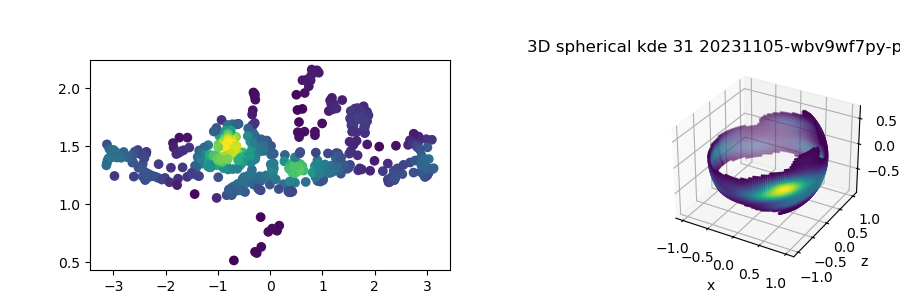

In [10]:
sph_densitys = []
kdes = []

for uId in ids:
    path = paths[uId] #ts[uId],xs[uId],ys[uId],zs[uId]
    print('file name',uId,fileNames[uId])
    t,xConc,yConc,zConc = path.T
    xyz = np.vstack([xConc,yConc,zConc])
    kde = stats.gaussian_kde(xyz)
    xc, yc, zc, thetac, phic, sph_density = tsi.panoramic_spherical_kde(kde,binSize=2)
    sph_densitys.append(sph_density)
    kdes.append(kde)
    
    fig = plt.figure(figsize=(9,3))
    ax = fig.add_subplot([0.7, 0.1, 0.3, 0.7] , projection='3d',) 
    th = 0.00001
    sc = ax.scatter(xc[sph_density>th], zc[sph_density>th], yc[sph_density>th], c=sph_density[sph_density>th],s=1)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title('3D spherical kde '+str(uId)+' '+fileNames[uId])

    ax1 = fig.add_subplot([0.1, 0.1, 0.4, 0.7]) 
    t,x,y,z = path.T
    xyz2 = np.vstack([x,y,z])
    theta,phi = tsi.cartesian_to_spherical(x,z,y)
    #ax1.plot(phi,theta)
    ax1.scatter(phi,theta,c=kde(xyz2))

In [11]:
len(sph_densitys)

32

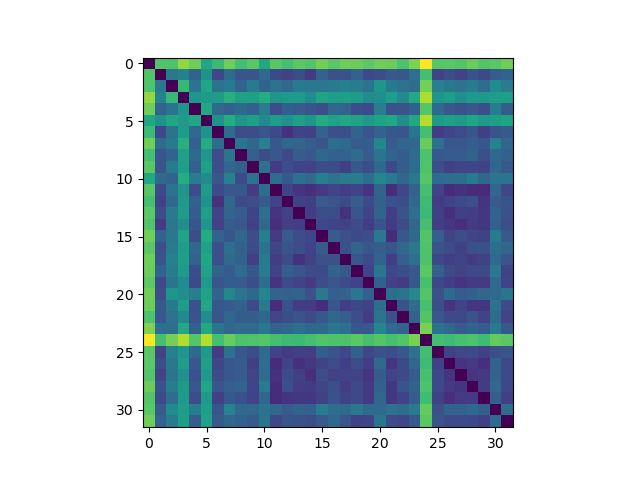

In [12]:
from scipy.spatial import distance
eucMat = distance.cdist(sph_densitys, sph_densitys, metric='euclidean')
plt.figure()
plt.imshow(eucMat)

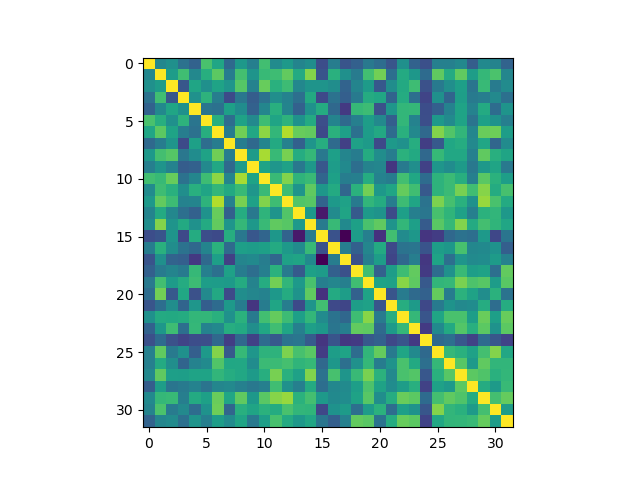

In [13]:
corr_matrix = np.corrcoef(sph_densitys)
plt.figure()
plt.imshow(corr_matrix)

In [14]:
np.min(np.exp(-corr_matrix))

0.36787944117144233

In [15]:
mask = np.ones(corr_matrix.shape, dtype=bool)
np.fill_diagonal(mask, 0)
max_value = corr_matrix[mask].max()
print('max',max_value)
print('argmax',np.where(corr_matrix==max_value))
bestMatch = np.where(corr_matrix==max_value)[0]
min_value = corr_matrix[mask].min()
print('min',min_value)
print('argmin',np.where(corr_matrix==min_value))
poorestMatch = np.where(corr_matrix==min_value)[0]

max 0.8635101169388946
argmax (array([ 6, 12], dtype=int64), array([12,  6], dtype=int64))
min -0.1859846257214403
argmin (array([15, 17], dtype=int64), array([17, 15], dtype=int64))


[2, 4, 7, 15, 21, 24, 16, 20, 1, 14, 9, 17, 0, 5, 26, 19, 22, 11, 29, 6, 12, 8, 10, 13, 25, 30, 3, 31, 18, 23, 27, 28]
[ 0  3  5  6  8 10 11 12 13 18 19 22 23 25 26 27 28 29 30 31]
[ 1  9 14 16 17 20]
[24]
[ 2  4  7 15 21]


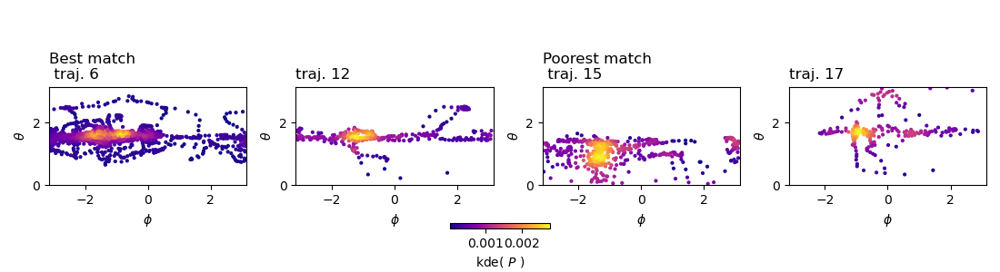

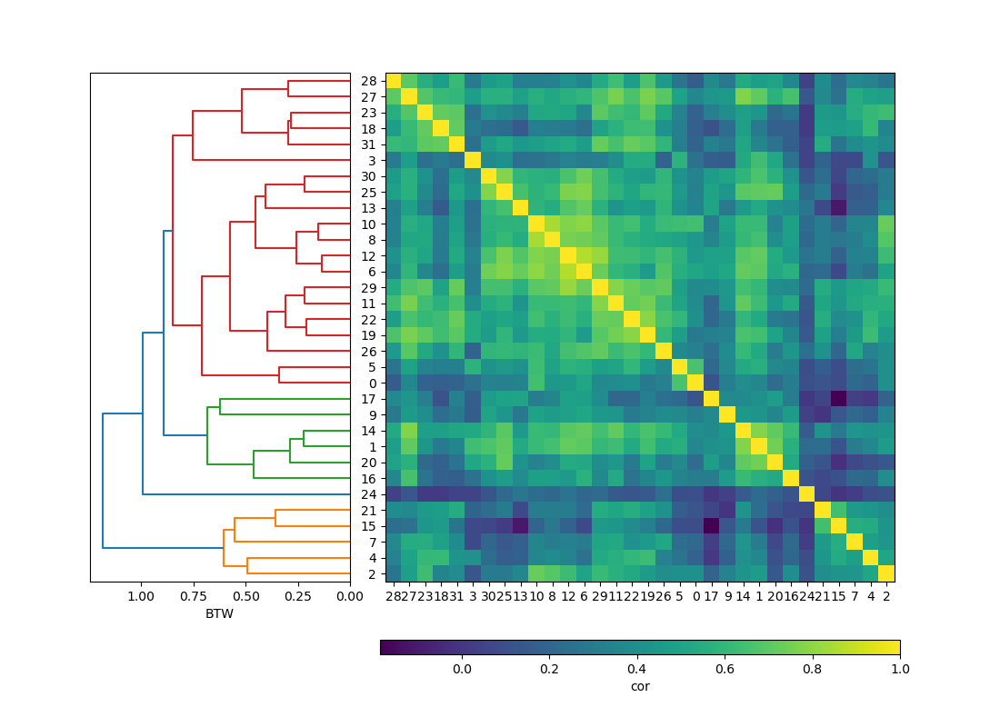

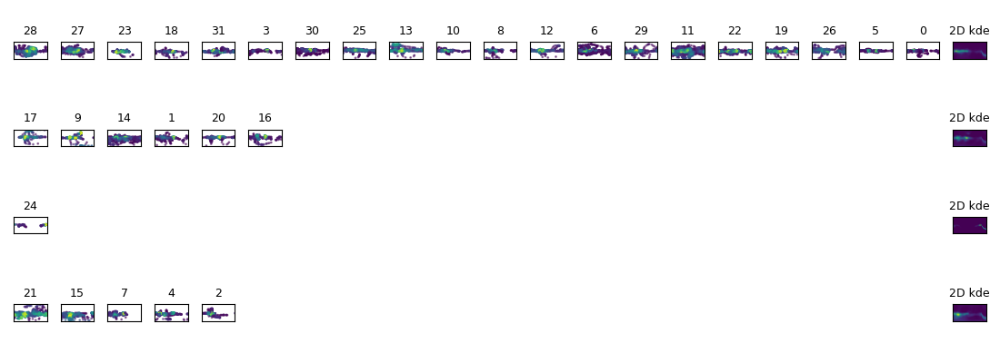

In [17]:
n_clusters = 4
model = AgglomerativeClustering(compute_full_tree=True, compute_distances=True,n_clusters=n_clusters, metric='precomputed', linkage='complete')
#cluster = model.fit_predict(np.exp(-corr_matrix))
cluster = model.fit_predict(1-corr_matrix)

f,axs= plt.subplots(1,4,figsize=(11,3))

t,x,y,z = paths[bestMatch[0]].T
kde = kdes[bestMatch[0]]
xyz2 = np.vstack([x,y,z])
theta,phi = tsi.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
Z = 1 /((2*np.pi/180)**2)
im2=axs[0].scatter(phi,theta,c=kde(xyz2)/Z ,s=4,zorder=1,cmap='plasma',label='traj.'+str(bestMatch[0]))
#axs[0].plot(phi,theta)

t,x,y,z = paths[bestMatch[1]].T
kde = kdes[bestMatch[1]]
xyz2 = np.vstack([x,y,z])
theta,phi = tsi.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
axs[1].scatter(phi,theta,c=kde(xyz2)/Z,s=4,zorder=1,cmap='plasma',label='traj.'+str(bestMatch[1]))
#axs[0].set_ylim((5.5,-5.5))
#axs[0].set_xlim((bbox['x1'],bbox['x0']))
#axs[0].axes.get_xaxis().set_ticks([])
#axs[0].axes.get_yaxis().set_ticks([])
axs[0].set_xlabel(r'$\phi$')
axs[0].set_ylabel(r'$\theta$')
axs[0].set_xlim((-np.pi,np.pi))
axs[0].set_ylim((0,np.pi))
axs[0].set_aspect('equal', adjustable='box')

axs[1].set_xlabel(r'$\phi$')
axs[1].set_ylabel(r'$\theta$')
axs[1].set_xlim((-np.pi,np.pi))
axs[1].set_ylim((0,np.pi))
axs[1].set_aspect('equal', adjustable='box')

axs[0].set_title('Best match \n traj. '+str(bestMatch[0]), loc='left')
axs[1].set_title('traj. '+str(bestMatch[1]), loc='left')
#axs[0].legend(loc=1)


t,x,y,z = paths[poorestMatch[0]].T
kde = kdes[poorestMatch[0]]
xyz2 = np.vstack([x,y,z])
theta,phi =tsi.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
axs[2].scatter(phi,theta,c=kde(xyz2)/Z,s=4,zorder=1,cmap='plasma',label='traj.'+str(poorestMatch[0]))

t,x,y,z = paths[poorestMatch[1]].T
kde = kdes[poorestMatch[1]]
xyz2 = np.vstack([x,y,z])
theta,phi = tsi.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
axs[3].scatter(phi,theta,c=kde(xyz2)/Z,s=4,zorder=1,cmap='plasma',label='traj.'+str(poorestMatch[1]))
#axs[0].set_ylim((5.5,-5.5))
#axs[0].set_xlim((bbox['x1'],bbox['x0']))
#axs[0].axes.get_xaxis().set_ticks([])
#axs[0].axes.get_yaxis().set_ticks([])
axs[2].set_xlabel(r'$\phi$')
axs[2].set_ylabel(r'$\theta$')
axs[2].set_xlim((-np.pi,np.pi))
axs[2].set_ylim((0,np.pi))
axs[2].set_aspect('equal', adjustable='box')

axs[3].set_xlabel(r'$\phi$')
axs[3].set_ylabel(r'$\theta$')
axs[3].set_xlim((-np.pi,np.pi))
axs[3].set_ylim((0,np.pi))
axs[3].set_aspect('equal', adjustable='box')

#axs[2].set_title('Poorest match '+str(poorestMatch[0])+','+str(poorestMatch[1]), loc='left')
axs[2].set_title('Poorest match \n traj. '+str(poorestMatch[0]), loc='left')
axs[3].set_title('traj. '+str(poorestMatch[1]), loc='left')
plt.tight_layout()

axcolor2 = f.add_axes([0.45, 0.16, 0.1, 0.02])
plt.colorbar(im2, cax=axcolor2, orientation = 'horizontal')
plt.xlabel('kde( $P$ )')



fig = plt.figure(figsize=(11, 8))
ax0 = fig.add_axes([0.09, 0.2, 0.26, 0.7])
ax1 = fig.add_axes([0.34, 0.2, 0.6, 0.7])
axcolor = fig.add_axes([0.38, 0.1, 0.52, 0.02])
dg = tsi.plot_dendrogram(model, n_clusters, orientation='left', ax=ax0)
ax0.set_yticks([])
ax0.set_xlabel('BTW')

leaves = dg['leaves']
print(leaves)
#tsi.plotSorted(corr_matrix,leaves)
#fig = plt.figure()
#ax = fig.add_subplot()
#ax.imshow(HsFlat[leaves,:].T,cmap='seismic')
#_=ax.set_xticks(leaves)
im = ax.imshow(corr_matrix)
tsi.plotSorted(corr_matrix,leaves[::-1],ax=ax1)
#ax1.set_title('D)', loc='left')
#fig = plt.figure()
#ax = fig.add_subplot()
#ax.imshow(HsFlat[leaves,:].T,cmap='seismic')
#_=ax.set_xticks(leaves)

plt.colorbar(im, cax=axcolor, orientation = 'horizontal')
axcolor.set_xlabel('cor')

nclusters = np.max(cluster)
#print(nclusters)
unique, counts = np.unique(cluster, return_counts=True)
#print(nclusters,unique, counts)
maxClSize = np.max(counts)
clOld = -1
fig = plt.figure(figsize=(11,4))
#plt.text(-0.02, 1.02, 'E)', fontsize=12)
plt.axis('off')

orderClusters = []
i = -1
j = 1

for uId in reversed(leaves):
    #print(uId)
    path = paths[uId] #ts[uId],xs[uId],ys[uId],zs[uId]
    #density = densities[uId]
    cl = cluster[uId]
    kde = kdes[uId]
    if cl != clOld:
        orderClusters.append(cl)
        i=i+1
        j = 1
        #dpath = dpaths[uId]
        #tsi.drawPath(path, dpath=None, BBox=bbox)
        #plt.stop()
        #print(uId,cl)
        clOld = cl
        #maxClSize = counts[unique == cl][0]
        #print('maxClSize',maxClSize)
        #fig = plt.figure()
    #print(maxClSize,int(maxClSize/6)+1,int(maxClSize%6)+1,i)
    #ax = fig.add_subplot(ceil(maxClSize/12), min([maxClSize,12]),i, projection='3d') 
    #print(uId,i,j)
    ax = fig.add_subplot(nclusters+1, maxClSize+1,j+i*(maxClSize+1)) 
    j = j +1
    th = 0.1
    #tsi.drawPath(path, dpath=None, BBox=bbox,ax=ax)
    #tsi.drawPath2DT(path, dpath=None, BBox=bbox,ax=ax, yup=True,pointSize=4)
    t,x,y,z = path.T
    #kde = kdes[bestMatch[1]]
    xyz2 = np.vstack([x,y,z])
    theta,phi = tsi.cartesian_to_spherical(x,z,y)
    ax.scatter(phi,theta,c=kde(xyz2),s=1,alpha=0.5,label='traj.'+str(bestMatch[1]))
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    #ax.set_xlabel(r'$\phi$')
    #ax.set_ylabel(r'$\theta$')
    ax.set_xlim((-np.pi,np.pi))
    ax.set_ylim((0,np.pi))
    ax.set_aspect('equal', adjustable='box')
    ax.set_title(str(uId), fontsize=9)
    #ax.axes.get_zaxis().set_ticks([])

for i,j in enumerate(orderClusters):
    clTrajs = np.where(cluster==j)[0]
    print(clTrajs)
    pathsConc =  np.vstack([paths[k] for k in clTrajs])
    tConv,xConc,yConc,zConc = pathsConc.T#np.concatenate(xs),np.concatenate(ys),np.concatenate(zs)

    xyz = np.vstack([xConc,yConc,zConc])
    kde = stats.gaussian_kde(xyz)
    xc, yc, zc, thetac, phic, sph_density = tsi.panoramic_spherical_kde(kde,binSize=2)

    f = np.reshape(sph_density.T, xc.shape)

    #fig = plt.figure()
    #ax = fig.gca()
    ax = fig.add_subplot(nclusters+1, maxClSize+1,(i+1)*(maxClSize+1)) 
    
    cfset = ax.scatter(phic, thetac, c=f)
    ax.set_title('2D kde', fontsize=9)
    ax.set_xlim((-np.pi,np.pi))
    ax.set_ylim((0,np.pi))
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    ax.set_aspect('equal', adjustable='box')

    clusterFileNames =  [fileNames[k] for k in clTrajs]
    pathOut = basePath
    kdefname = '/panoramic-dir-3d-kde-cluster'+str(i)+'.json'
    tsi.write_panoramic_kde_tojson(sph_density, xc, yc, zc, bbox, binSize=2, recordsFolderName=pathSes, records=clusterFileNames, filename=pathOut+kdefname)

plt.tight_layout()